# Advances in Financial Machine Learning
***Marcos Lopez de Prado***

### Chapter 10: **Bet Sizing**

##### Present by: Hirad Dolatzadeh

### Why bet sizing?

> Some of the best portfolio managers I have worked with are excellent poker players...

Your ML algorithm can achieve high accuracy, but if you do not size your bets properly, your investment strategy will inevitably lose money

### Why bet sizing?
Let $m_{i,t}$ ∈ [−1, 1] be the bet size of strategy i at time t

where:
- $m_{i,t}$ = −1 indicates a full short position 
- $m_{i,t}$ =  1 indicates a full long position.

1. [$m_{1,1}$, $m_{1,2}$, $m_{1,3}$] = [0.5, 1, 0]
2. [$m_{2,1}$, $m_{2,2}$, $m_{2,3}$] = [1, 0.5, 0]

- $P_{t}$: the price at time $t$: [$P_{1}$, $P_{2}$, $P_{3}$]=[1, 0.5, 1.25]

    -The first strategy made money (50%) while the second lost (12.5%)

# Import libraries

In [1]:
# %%capture
# !pip install plotly -U

In [2]:
import pandas as pd
import numpy as np 
import datetime
import time

from scipy import stats
from scipy.stats import norm

import matplotlib.pyplot as plt

import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import multiprocessing as mp

import sys
import warnings
warnings.simplefilter('ignore')
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings(
    'ignore',
    category=ResourceWarning,
    message='ResourceWarning: unclosed'
)

pd.options.plotting.backend = "plotly"
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

## Functions (Chapter 20)

In [3]:
# SNIPPET 20.5 THE linParts FUNCTION
def linParts(numAtoms,numThreads):
    # partition of atoms with a single loop
    parts=np.linspace(0,numAtoms,min(numThreads,numAtoms)+1)
    parts=np.ceil(parts).astype(int)
    return parts

# SNIPPET 20.6 THE nestedParts FUNCTION
def nestedParts(numAtoms,numThreads,upperTriang=False):
    # partition of atoms with an inner loop
    parts,numThreads_=[0],min(numThreads,numAtoms)
    for num in range(numThreads_):
        part=1 + 4*(parts[-1]**2+parts[-1]+numAtoms*(numAtoms+1.)/numThreads_)
        part=(-1+part**.5)/2.
        parts.append(part)
    parts=np.round(parts).astype(int)
    if upperTriang: # the first rows are the heaviest
        parts=np.cumsum(np.diff(parts)[::-1])
        parts=np.append(np.array([0]),parts)
    return parts

# SNIPPET 20.7 THE mpPandasObj, USED AT VARIOUS POINTS IN THE BOOK
def mpPandasObj(func, pdObj, numThreads = 24, mpBatches = 1, linMols = True, **kargs):
    '''
    Parallelize jobs, return a dataframe or series
    :params func: function to be parallelized. Returns a DataFrame
    :params pdObj: tuple,
        + pdObj[0]: Name of argument used to pass the molecule
        + pdObj[1]: List of atoms that will be grouped into molecules
    :params numThreads: int, no. of threads that will be used in parallel (1 processor per thread)
    :params mpBatches: int, no. of parallel batches (jobs per core)
    :params linMols: bool, whether partitions will be linear or double-nested
    :params kwds: any other argument needed by func
    Example: df1=mpPandasObj(func,('molecule',df0.index),24,**kwds)
    '''
    import pandas as pd
    # ----------------Partition the dataset-------------------------
    # parts: the indices to separate
    if linMols:
        parts = linParts(len(pdObj[1]), numThreads * mpBatches)
    else:
        parts = nestedParts(len(pdObj[1]), numThreads * mpBatches)

    jobs = []
    for i in range(1, len(parts)):
        # name of argument: molecule, function: func
        job = {pdObj[0]: pdObj[1][parts[i - 1]:parts[i]], 'func': func}
        job.update(kargs) # update kargs?
        jobs.append(job)
    # -----------------multiprocessing--------------------
    if numThreads == 1:
        out = processJobs_(jobs)
    else:
        out = processJobs(jobs, numThreads = numThreads)
    #------------determine the datatype of the output----
    try:
        if len(out) == 0:
            return pd.DataFrame()
        elif isinstance(out[0], pd.DataFrame):
            df0 = pd.DataFrame()
        elif isinstance(out[0], pd.Series):
            df0 = pd.Series()
        else:
            return out
        # Append the output to the df0
        for i in out:
            df0 = df0.append(i)
        # sort objects by labels
        df0 = df0.sort_index()
    except:
        print(type(out))
        df0 = pd.DataFrame()
    return df0

# SNIPPET 20.8 SINGLE-THREAD EXECUTION, FOR DEBUGGING
def processJobs_(jobs):
    # Run jobs sequentially, for debugging
    out=[]
    for job in jobs:
        out_=expandCall(job)
        out.append(out_)
    return out

# SNIPPET 20.9 EXAMPLE OF ASYNCHRONOUS CALL TO PYTHON’S MULTIPROCESSING LIBRARY
def reportProgress(jobNum,numJobs,time0,task):
    # Report progress as asynch jobs are completed
    msg=[float(jobNum)/numJobs,(time.time()-time0)/60.]
    msg.append(msg[1]*(1/msg[0]-1))
    timeStamp=str(datetime.datetime.fromtimestamp(time.time()))
    msg= timeStamp+' '+str(round(msg[0]*100,2))+'% '+task+' done after '+ str(round(msg[1],2))+' minutes. Remaining '+str(round(msg[2],2))+' minutes.'
    if jobNum<numJobs:
        sys.stderr.write(msg+'\r')
    else:
        sys.stderr.write(msg+'\n')
    return

def processJobs(jobs,task=None,numThreads=24):
    # Run in parallel.
    # jobs must contain a ’func’ callback, for expandCall
    if task is None:task=jobs[0]['func'].__name__
    pool=mp.Pool(processes=numThreads)
    outputs,out,time0=pool.imap_unordered(expandCall,jobs),[],time.time()
    # Process asynchronous output, report progress
    for i,out_ in enumerate(outputs,1):
        out.append(out_)
        reportProgress(i,len(jobs),time0,task)
    pool.close()
    pool.join() # this is needed to prevent memory leaks
    return out

# SNIPPET 20.10 PASSING THE JOB (MOLECULE) TO THE CALLBACK FUNCTION
def expandCall(kargs):
    # Expand the arguments of a callback function, kargs[’func’]
    func=kargs['func']
    del kargs['func']
    out=func(**kargs)
    return out

In [4]:
def progressBar(value, end_value, start_time, bar_length=20):
    percent = float(value) / end_value
    arrow = '-' * int(round(percent * bar_length)-1) + '>'
    spaces = ' ' * (bar_length - len(arrow))
    remaining = int(((time.time()-start_time)/value)*(end_value-value)/60)
    sys.stdout.write("\rCompleted: [{0}] {1}% - {2} minutes remaining.".format(arrow + spaces, int(round(percent * 100)), remaining))
    sys.stdout.flush()

In [5]:
def get_ohlcv(df_group):
    ohlc = df_group['price'].ohlc()
    ohlc['volume'] = df_group['size'].sum()
    ohlc['vwap'] = df_group.apply(lambda x: (x['price']*x['size']).sum()/x['size'].sum())
    ohlc['twap'] = df_group['price'].mean()
    ohlc['tick_count'] = df_group['price'].count()
    ohlc['twap_logr'] = np.log(ohlc['twap']) - np.log(ohlc['twap'].shift(1))
    return ohlc

def get_time_bar(df, freq="5Min"):
    df_group = df.groupby(pd.Grouper(freq=freq))
    ohlcv = get_ohlcv(df_group)
    return ohlcv

In [6]:
def plot_ohlcv(ohlcv):
    dt_all = pd.date_range(start=ohlcv.index[0],end=ohlcv.index[-1])
    dt_obs = [d.strftime("%Y-%m-%d") for d in ohlcv.index]
    dt_breaks = [d for d in dt_all.strftime("%Y-%m-%d").tolist() if not d in dt_obs]
    fig = make_subplots(rows=3, cols=1,
                        shared_xaxes=True,
                        vertical_spacing=0.05, specs=[[{"rowspan": 2}], 
                                                    [{}], 
                                                    [{}]])
    fig.add_trace(go.Candlestick(x=ohlcv.index, 
                                open=ohlcv.open, 
                                high=ohlcv.high,
                                low=ohlcv.low, 
                                close=ohlcv.close, name='Candlestick'), row=1, col=1)
    fig.add_trace(go.Bar(x=ohlcv.index, y=ohlcv.volume, marker_color='rgba(255, 100, 100, 0.7)', name='volume'), row=3, col=1)
    fig.update_yaxes(title_text="Price", row=1, col=1)
    fig.update_yaxes(title_text="Volume", row=3, col=1)
    fig.update_xaxes(
            rangeslider_visible=False,
            rangebreaks=[
                dict(bounds=["sat", "mon"]),  # hide weekends, eg. hide sat to before mon
                dict(bounds=[16, 9.5], pattern="hour"),  # hide hours outside of 9.30am-4pm
                dict(values=dt_breaks)  # hide empty dates
            ]
        )
    fig.update_layout(xaxis_rangeslider_visible=False)
    fig.show()

# Import Tick Data

In [7]:
dir = "https://raw.githubusercontent.com/risk-labratory/data/main/"
url = dir + "IVE_2010-2020.csv" #change again
df = pd.read_csv(url, header=0)
df['dates'] = pd.to_datetime(df['dates'])
df.set_index('dates', inplace=True, drop=True)
df.drop_duplicates(inplace=True)
df = df[(df.index.hour>=9) & (df.index.hour<16)]
df.head()

,price,bid,ask,size
dates,,,,
2010-01-04 09:26:31,53.55,53.29,53.55,100
2010-01-04 09:27:35,53.84,53.01,53.85,100
2010-01-04 09:29:59,53.47,53.35,53.47,100
2010-01-04 09:30:00,53.47,53.35,53.47,358
2010-01-04 09:30:01,53.45,53.35,53.45,1468


# Data Analysis: Chapter 2-5

In [8]:
def applyPtSlOnT1(close, events, ptSl, molecule):
    # apply stop loss/profit taking, if it takes place before t1 (end of event)
    events_ = events.loc[molecule]
    out = events_[['t1']].copy(deep=True)
    if ptSl[0] > 0:
        pt = ptSl[0] * events_['trgt']
    else:
        pt = pd.Series(index=events.index)  # NaNs
    if ptSl[1] > 0:
        sl = -ptSl[1] * events_['trgt']
    else:
        sl = pd.Series(index=events.index)  # NaNs
    for loc, t1 in events_['t1'].fillna(close.index[-1]).iteritems():
        df0 = close[loc:t1]  # path prices
        df0 = (df0 / close[loc] - 1) * events_.at[loc, 'side']  # path returns
        out.loc[loc, 'sl'] = df0[df0 < sl[loc]].index.min()  # earliest stop loss.
        out.loc[loc, 'pt'] = df0[df0 > pt[loc]].index.min()  # earliest profit taking.
    return out

In [9]:
def getTEvents(gRaw, h):
    tEvents, sPos, sNeg = [], 0, 0
    diff = gRaw.diff()
    for i in diff.index[1:]:
        sPos, sNeg = max(0, sPos+diff.loc[i]), min(0, sNeg+diff.loc[i])
        if sNeg<-h:
            sNeg=0
            tEvents.append(i)
        elif sPos>h:
            sPos=0
            tEvents.append(i)
    return pd.DatetimeIndex(tEvents)

In [10]:
def getEvents(close, tEvents, ptSl, trgt, minRet, numThreads, t1=False):
    # 1) get target
    trgt = trgt.loc[tEvents]
    trgt = trgt[trgt > minRet]  # minRet
    # 2) get t1 (max holding period)
    if t1 is False: 
        t1 = pd.Series(pd.NaT, index=tEvents)
    # 3) form events object, apply stop loss on t1
    side_ = pd.Series(1., index=trgt.index)
    events = pd.concat({'t1': t1, 'trgt': trgt, 'side': side_}, axis=1).dropna(subset=['trgt'])
    df0 = mpPandasObj(func=applyPtSlOnT1, pdObj=('molecule', events.index), 
                      numThreads=numThreads, close=close, events=events, ptSl=[ptSl, ptSl])
    events['t1'] = df0.dropna(how='all').min(axis=1)  # pd.min ignores nan
    events = events.drop('side', axis=1)
    return events

In [11]:
def getBins(events, close):
    # 1) prices aligned with events
    events_ = events.dropna(subset=['t1'])
    px = events_.index.union(events_['t1'].values).drop_duplicates()
    px = close.reindex(px, method='bfill')
    # 2) create out object
    out = pd.DataFrame(index=events_.index)
    out['ret'] = px.loc[events_['t1'].values].values / px.loc[events_.index] - 1
    out['bin'] = np.sign(out['ret'])
    return out

In [12]:
def getEventsM(close,tEvents,ptSl,trgt,minRet,numThreads,t1=False,side=None):
    #1) get target
    trgt = trgt.loc[tEvents]
    trgt = trgt[trgt > minRet] # minRet
    #2) get t1 (max holding period)
    if t1 is False:
        t1 = pd.Series(pd.NaT, index=tEvents)
    #3) form events object, apply stop loss on t1
    if side is None:
        side_, ptSl_ = pd.Series(1.,index=trgt.index), [ptSl[0],ptSl[0]]
    else:
        side_, ptSl_ = side.loc[trgt.index], ptSl[:2]
    events = pd.concat({'t1':t1,'trgt':trgt,'side':side_},axis=1).dropna(subset=['trgt'])
    df0 = mpPandasObj(func=applyPtSlOnT1, pdObj=('molecule',events.index), 
                      numThreads=numThreads, close=close, events=events, ptSl=ptSl_)
    events['t1'] = df0.dropna(how='all').min(axis=1) # pd.min ignores nan
    if side is None:
        events = events.drop('side',axis=1)
    return events

In [13]:
def getBinsM(events, close):
    """
    Compute event's outcome (including side information, if provided).
    events is a DataFrame where:
    —events.index is event's starttime
    —events[’t1’] is event's endtime
    —events[’trgt’] is event's target
    —events[’side’] (optional) implies the algo's position side
    Case 1: (’side’ not in events): bin in (-1,1) <—label by price action
    Case 2: (’side’ in events): bin in (0,1) <—label by pnl (meta-labeling)
    """
    # 1) prices aligned with events
    events_ = events.dropna(subset=['t1'])
    px = events_.index.union(events_['t1'].values).drop_duplicates()
    px = close.reindex(px, method='bfill')
    # 2) create out object
    out = pd.DataFrame(index=events_.index)
    out['ret'] = px.loc[events_['t1'].values].values / px.loc[events_.index] - 1
    if 'side' in events_: 
        out['ret'] *= events_['side']  # meta-labeling
    out['bin'] = np.sign(out['ret'])
    if 'side' in events_: 
        out.loc[out['ret'] <= 0, 'bin'] = 0  # meta-labeling
    return out

## Previous section results:

In [14]:
ohlcv = get_time_bar(df, freq="1B")
ohlcv.dropna(inplace=True)
close = ohlcv.close
ohlcv.head()

,open,high,low,close,volume,vwap,twap,tick_count,twap_logr
dates,,,,,,,,,
2010-01-05,53.93,54.180,53.7500,54.1600,362368,54.035639,54.023870,922,0.003535
2010-01-06,54.12,54.400,54.0800,54.2800,302206,54.292685,54.291866,839,0.004948
2010-01-07,54.34,54.840,54.1600,54.7544,302109,54.608914,54.601039,712,0.005678
2010-01-08,54.64,54.860,54.5419,54.8500,156692,54.654050,54.658255,434,0.001047
2010-01-11,55.07,55.179,54.8000,55.0500,229643,54.972738,54.975758,701,0.005792


### DAILY VOLATILITY ESTIMATES

In [15]:
def getDailyVol(close, span0=63):
    # daily vol, reindexed to close
    df0 = close.index.searchsorted(close.index - pd.Timedelta(days=1))
    df0 = df0[df0 > 0]
    df0 = pd.Series(close.index[df0 - 1], index=close.index[close.shape[0] - df0.shape[0]:])
    rets = (close.loc[df0.index] / close.loc[df0.values].values - 1).rename("rets")  # daily returns
    stds = rets.ewm(span=span0).std().rename("std")
    return rets, stds

In [16]:
rets, stds = getDailyVol(close, span0=32)
fig = go.Figure()
fig.add_trace(go.Scatter(x=rets.index, y=rets.values, mode="lines", marker=dict(color='firebrick'), name="rets"))
fig.add_trace(go.Scatter(x=rets.index, y=stds.values, mode="lines", marker=dict(color='royalblue'),  name="stds"))
fig.add_trace(go.Scatter(x=rets.index, y=-stds.values, mode="lines", marker=dict(color='royalblue'),  name="-stds"))

In [17]:
numDays = 21
tEvents = getTEvents(close, h=2)   # THE SYMMETRIC CUSUM FILTER

In [18]:
#tEvents = close.index
fig = close.plot()
fig.add_trace(go.Scatter(x=tEvents, y=close[tEvents], mode="markers", name="tEvents"))
fig.show()

In [19]:
t1 = close.index.searchsorted(tEvents+pd.Timedelta(days=numDays))  # Vertical barrier
t1 = t1[t1<close.shape[0]]
t1 = pd.Series(close.index[t1],index=tEvents[:t1.shape[0]]) # NaNs at end
rets, stds = getDailyVol(close, span0=32)
events = getEvents(close, tEvents, ptSl=1, trgt=stds, minRet=0.0, numThreads=1, t1=t1)  # finds the time of the first barrier touch
out = getBinsM(events, close)  # label the observations
out = out.loc[t1.index]
print(len(out), len(close))
# out.tail(15)

381 2669


**Bet sizing approaches:**
1. Gaussian mixture
1. Budgeting approach
1. Meta-labeling
1. From Predicted Probabilities
1. Dynamic position size

# STRATEGY-INDEPENDENT BET SIZING APPROACHES

## 1.gaussian mixture

* $c_{t,l}$ is the number of concurrent long bets at time t
* $c_{t,s}$ is the number of concurrent short bets at time t
* $c_{t}$ = $c_{t,l}$ - $c_{t,s}$

We fit a mixture of two Gaussians on $c_{t}$:
* F[x] is the CDF of the fitted mixture of two Gaussians for a value x

The bet size is derived as:

$m_{t}=\left\{\begin{array}{l}\frac{F\left[c_{t}\right]-F[0]}{1-F[0]} \text { if } c_{t} \geq 0 \\ \frac{F\left[c_{t}\right]-F[0]}{F[0]} \text { if } c_{t}<0\end{array}\right.$

### Find the number of long/short concurrencies

In [20]:
concurrency = pd.DataFrame()

for idx in events.index:    
    # A bet side greater than zero indicates a long position.
    df_long_active_idx = set(events[(events.index <= idx) & (events['t1'] > idx) & (out['ret'] >= 0)].index)
    concurrency.loc[idx, 'active_long'] = len(df_long_active_idx)
    # A bet side less than zero indicates a short position.
    df_short_active_idx = set(events[(events.index <= idx) & (events['t1'] > idx) & (out['ret'] < 0)].index)
    concurrency.loc[idx, 'active_short'] = len(df_short_active_idx)
    
concurrency['ct'] = concurrency['active_long'] - concurrency['active_short']

In [21]:
concurrency.tail(10)

,active_long,active_short,ct
2020-11-13,2.0,0.0,2.0
2020-11-16,2.0,0.0,2.0
2020-11-18,3.0,0.0,3.0
2020-11-24,2.0,0.0,2.0
2020-11-30,3.0,0.0,3.0
2020-12-03,3.0,1.0,2.0
2020-12-14,1.0,1.0,0.0
2020-12-17,0.0,1.0,-1.0
2020-12-22,0.0,1.0,-1.0
2020-12-30,0.0,0.0,0.0


In [22]:
pd.concat([events['t1'], out['bin'], concurrency],axis=1, join='outer')[-60:-50]

,t1,bin,active_long,active_short,ct
2020-04-01,2020-04-06,1.0,2.0,0.0,2.0
2020-04-02,2020-04-08,1.0,3.0,0.0,3.0
2020-04-06,2020-04-09,1.0,3.0,0.0,3.0
2020-04-08,2020-04-29,1.0,2.0,0.0,2.0
2020-04-09,2020-04-30,1.0,2.0,0.0,2.0
2020-04-15,2020-04-29,1.0,3.0,0.0,3.0
2020-04-17,2020-05-08,-1.0,3.0,1.0,2.0
2020-04-20,2020-05-11,1.0,4.0,1.0,3.0
2020-04-21,2020-04-27,1.0,5.0,1.0,4.0
2020-04-24,2020-04-29,1.0,6.0,1.0,5.0


In [23]:
from sklearn.mixture import GaussianMixture

In [24]:
gm = GaussianMixture(n_components=2, random_state=0)
X = concurrency['ct'].to_numpy().reshape(-1, 1)
gm.fit(X)

GaussianMixture(n_components=2, random_state=0)

The CDF of mixed Gaussian distributions with CDF of ${F_1}$,${F_2}$,${F_3}$...,and weights of ${ω_1}$,${ω_2}$,${ω_3}$..., equals to ${F_{mixed}}$ = ${ω_1}$ ${\times}$ ${F_1}$ + ${ω_2}$ ${\times}$ ${F_2}$ + ${ω_3}$ ${\times}$ ${F_3}$ + ...

In [25]:
weights  = gm.weights_
means = gm.means_
covars = gm.covariances_

def mix_norm_cdf(x, weights=weights, means=means, covars=covars):
    mcdf = 0.0
    for i in range(len(weights)):
        mcdf += weights[i] * norm.cdf(x, loc=means[i], scale=covars[i])
    return float(mcdf)

$m_{t}=\left\{\begin{array}{l}\frac{F\left[c_{t}\right]-F[0]}{1-F[0]} \text { if } c_{t} \geq 0 \\ \frac{F\left[c_{t}\right]-F[0]}{F[0]} \text { if } c_{t}<0\end{array}\right.$

In [26]:
def gaussianBet(c):
    if c>=0:
        return (mix_norm_cdf(c) - mix_norm_cdf(0))/(1-mix_norm_cdf(0))
    else: 
        return (mix_norm_cdf(c) - mix_norm_cdf(0))/mix_norm_cdf(0)

In [27]:
gaussianBet(-1)

-0.2461807766724358

In [28]:
bets = pd.DataFrame()
bets['gaussian'] = concurrency['ct'].apply(gaussianBet)
bets.tail()

,gaussian
2020-12-03,0.979424
2020-12-14,0.000000
2020-12-17,-0.246181
2020-12-22,-0.246181
2020-12-30,0.000000


## 2.budgeting approach

- Compute the maximum number of concurrent long ($max(c_{t,l})$) & short ($max(c_{t,s})$) bets.  


- Bet size in time t is derived:

    - $m_{t}$ = $c_{t,l}$  $\frac{1}{max(c_{t,l})}$ - $c_{t,s}$  $\frac{1}{max(c_{t,s})}$

In [29]:
active_long_max = concurrency['active_long'].max()
active_short_max = concurrency['active_short'].max()

long_size = (concurrency['active_long'] / active_long_max).fillna(0)
short_size = (concurrency['active_short'] / active_short_max).fillna(0)

bets['budgeting'] = long_size - short_size

bets

,gaussian,budgeting
2010-01-22,0.356594,0.166667
2010-02-04,0.356594,0.166667
2010-02-18,0.356594,0.166667
2010-03-05,0.356594,0.166667
2010-03-23,0.356594,0.166667
...,...,...
2020-12-03,0.979424,0.250000
2020-12-14,0.000000,-0.083333
2020-12-17,-0.246181,-0.250000
2020-12-22,-0.246181,-0.250000


## 3.Meta-labeling

As discussed in Chapter 3, fit a classifier, such as an SVC or RF, to determine the probability of misclassification, and use that probability to derive the bet size.

### Meta-labeling advantages:
1. The ML algorithm that decides the bet sizes is independent of the primary model, allowing for the incorporation of features predictive of false positives.
1. The predicted probability can be directly translated into bet size.

## 4.Bet sizing from predicted probabilities

## Building up the Feature Matrix

### Simple Moving Average (SMA)

In [30]:
X = ohlcv.copy(deep= True)
X['SMA_5'] = X['close'].rolling(window=5).mean()
X['SMA_15'] = X['close'].rolling(window=15).mean()
X['volume_ratio'] = X['volume'].rolling(window=5).mean()/X['volume'].rolling(window=15).mean()

In [31]:
# Create figure with secondary y-axis
fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02,
                    row_heights= [0.8, 0.2])

# include candlestick with rangeselector
fig.add_trace(go.Scatter(x=X.index, y=X['close'], name= 'S&P 500'),row=1, col=1)
fig.add_trace(go.Scatter(x=X.index, y=X['SMA_5'], name= 'SMA 5'),row=1, col=1)
fig.add_trace(go.Scatter(x=X.index, y=X['SMA_15'], name= 'SMA 15'),row=1, col=1)

# include a go.Bar trace for volumes
fig.add_trace(go.Bar(x=X.index, y= X['volume'], name= 'volume'),row=2, col=1)
#fig.add_trace(go.Scatter(x=X.index, y=(X['volume_ratio'] * 1000000) , name= '15Ewm'),row=2, col=1)

fig.show()

### Relative Strength Index (RSI)

In [32]:
X['Diff'] = X['close'].diff()
X['Up'] = X['Diff']
X.loc[(X['Up']<0), 'Up'] = 0

X['Down'] = X['Diff']
X.loc[(X['Down']>0), 'Down'] = 0 
X['Down'] = abs(X['Down'])

X['avg_5up'] = X['Up'].rolling(window=5).mean()
X['avg_5down'] = X['Down'].rolling(window=5).mean()

X['avg_15up'] = X['Up'].rolling(window=15).mean()
X['avg_15down'] = X['Down'].rolling(window=15).mean()

X['RS_5'] = X['avg_5up'] / X['avg_5down']
X['RS_15'] = X['avg_15up'] / X['avg_15down']

X['RSI_5'] = 100 - (100/(1+X['RS_5']))
X['RSI_15'] = 100 - (100/(1+X['RS_15']))

#X['RSI_ratio'] = X['RSI_5']/X['RSI_15']

In [33]:
# Create figure with secondary y-axis
fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02,
                    row_heights= [0.8, 0.2])

# include candlestick with rangeselector
fig.add_trace(go.Scatter(x=X.index, y=X['close'], name= 'S&P 500'),row=1, col=1)

# include a go.Bar trace for volumes
fig.add_trace(go.Scatter(x=X.index, y=(X['RSI_5']) , name= 'RSI 5'),row=2, col=1)
fig.add_trace(go.Scatter(x=X.index, y=(X['RSI_15']) , name= 'RSI 15'),row=2, col=1)
fig.add_hrect(y0="30", y1="70",fillcolor="LightSalmon", opacity=0.5,layer="below", line_width=0, row=2, col=1 )
fig.show()

### Stochastic Oscillators

In [34]:
X['Lowest_5D'] = X['low'].rolling(window=5).min()
X['High_5D'] = X['high'].rolling(window=5).max()
X['Lowest_15D'] = X['low'].rolling(window=15).min()
X['High_15D'] = X['high'].rolling(window=15).max()

X['Stochastic_5'] = ((X['close'] - X['Lowest_5D'])/(X['High_5D'] - X['Lowest_5D']))*100
X['Stochastic_15'] = ((X['close'] - X['Lowest_15D'])/(X['High_15D'] - X['Lowest_15D']))*100

X['Stochastic_%D_5'] = X['Stochastic_5'].rolling(window = 5).mean()
X['Stochastic_%D_15'] = X['Stochastic_5'].rolling(window = 15).mean()

In [35]:
# Create figure with secondary y-axis
fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02,
                    row_heights= [0.8, 0.2])

# include candlestick with rangeselector
fig.add_trace(go.Scatter(x=X.index, y=X['close'], name= 'S&P 500'),row=1, col=1)

# include a go.Bar trace for volumes
fig.add_trace(go.Scatter(x=X.index, y=(X['Stochastic_%D_5']) , name= 'Stochastic 5D'),row=2, col=1)
fig.add_trace(go.Scatter(x=X.index, y=(X['Stochastic_%D_15']) , name= 'Stochastic 15D'),row=2, col=1)
fig.add_hrect(y0="20", y1="80",fillcolor="LightSalmon", opacity=0.5,layer="below", line_width=0, row=2, col=1 )
fig.show()

### Moving Average Convergence Divergence (MACD)

In [36]:
X['5Ewm'] = X['close'].ewm(span= 5).mean()
X['15Ewm'] = X['close'].ewm(span= 15).mean()
X['MACD'] =  X['5Ewm'] - X['15Ewm']

In [37]:
# Create figure with secondary y-axis
fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02,
                    row_heights= [0.8, 0.2])

# include candlestick with rangeselector
fig.add_trace(go.Scatter(x=X.index, y=X['close'], name= 'S&P 500'),row=1, col=1)

# include a go.Bar trace for volumes
fig.add_trace(go.Bar(x=X.index, y= 3* X['MACD'], name= 'MACD'),row=2, col=1)
fig.add_trace(go.Scatter(x=X.index, y=(X['15Ewm']-X['15Ewm'].mean()) , name= '15Ewm'),row=2, col=1)
fig.add_trace(go.Scatter(x=X.index, y=(X['5Ewm']-X['15Ewm'].mean()), name= '5Ewm'),row=2, col=1)

fig.show()

### Bollinger Bands

In [38]:
X['15MA'] = X['close'].rolling(window=15).mean()
X['SD'] = X['close'].rolling(window=15).std()
X['upperband'] = X['15MA'] + 2*X['SD']
X['lowerband'] = X['15MA'] - 2*X['SD']

In [39]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=X.index, y=X['close'], name= 'S&P 500'))
fig.add_trace(go.Scatter(x=X.index, y= X['upperband'] , name= 'upperband'))
fig.add_trace(go.Scatter(x=X.index, y= X['lowerband'], name= 'lowerband'))

fig.show()

### The Feature Matrix

In [40]:
X = X[['SMA_5', 'SMA_15', 'volume_ratio', 'RSI_5', 'RSI_15', 'Stochastic_5', 'Stochastic_15', 'MACD', 'upperband', 'lowerband']]
X = X.loc[out.index,:].dropna()
out = out[-len(X):]
y = out['bin'].copy()
display(X)

,SMA_5,SMA_15,volume_ratio,RSI_5,RSI_15,Stochastic_5,Stochastic_15,MACD,upperband,lowerband
2010-02-04,52.43800,53.173220,1.027770,37.185930,32.346104,0.456621,0.256410,-0.555708,55.500902,50.845538
2010-02-18,52.19400,52.122447,0.904871,95.287958,54.943668,97.445938,91.301646,0.109469,53.705076,50.539817
2010-03-05,54.12454,53.314847,1.075054,99.382754,83.846464,97.267123,98.974293,0.687717,54.959033,51.670660
2010-03-23,56.53000,55.581573,0.994647,76.129032,88.089330,97.478992,99.056604,0.862741,57.378737,53.784410
2010-04-14,58.04200,57.223333,0.718018,99.354839,74.890830,100.000000,100.000000,0.804844,58.654809,55.791857
...,...,...,...,...,...,...,...,...,...,...
2020-11-16,122.64400,116.856000,1.126152,75.930521,71.194763,89.509306,96.333335,3.492436,127.073220,106.638780
2020-11-18,123.16000,118.466000,0.957794,54.433498,79.561043,52.622673,83.440869,2.995766,128.578685,108.353315
2020-11-24,123.80600,121.675333,0.670683,67.381317,77.266576,95.339806,98.125000,2.615576,128.439245,114.911421
2020-11-30,124.74200,122.950000,0.795522,61.683599,68.073642,50.746269,79.047619,2.224577,128.010570,117.889430


In [41]:
# Output labels
y

2010-02-04    1.0
2010-02-18    1.0
2010-03-05    1.0
2010-03-23    1.0
2010-04-14   -1.0
             ... 
2020-11-16    1.0
2020-11-18    1.0
2020-11-24    1.0
2020-11-30    1.0
2020-12-03   -1.0
Name: bin, Length: 380, dtype: float64

### Train test split

In [42]:
# Train test split
X_train, X_test, y_train, y_test = X.iloc[:-int(len(X)*0.30)], X.iloc[-int(len(X)*0.30):], out.iloc[:-int(len(X)*0.30),1], out.iloc[-int(len(X)*0.30):,1]

In [43]:
# feature scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [44]:
pd.DataFrame(X_test)

,0,1,2,3,4,5,6,7,8,9
0,1.337780,1.338741,0.968273,1.212820,0.559981,1.023450,0.648595,0.515052,1.293719,1.376868
1,1.484084,1.396188,-0.827461,0.380267,1.706628,0.599365,1.032056,1.182049,1.410008,1.373447
2,1.531485,1.521243,0.529725,-0.880489,-0.441268,-0.816943,-0.874843,0.187366,1.432349,1.603376
3,1.418466,1.491678,1.321898,-1.302564,-1.159550,-1.046016,-1.205551,-0.955111,1.489004,1.485318
4,1.357141,1.393997,-0.699091,-0.755435,-0.989395,-0.722044,-1.083856,-0.751842,1.401794,1.377463
...,...,...,...,...,...,...,...,...,...,...
109,1.820850,1.529785,0.221958,0.766090,1.244227,0.827459,1.094672,3.552396,1.860604,1.180208
110,1.845457,1.606475,-0.350220,0.114404,1.724483,-0.041953,0.763147,3.075905,1.931110,1.262790
111,1.876263,1.759348,-1.325994,0.506920,1.592772,0.964883,1.140744,2.711160,1.924579,1.578670
112,1.920898,1.820066,-0.901718,0.334192,1.065063,-0.086179,0.650176,2.336045,1.904503,1.722109


### Bet Sizing from Predicted Probabilities
- Let us denote p[x] the probability that label $x$ takes place. We would like to use this predicted probability to derive the bet size
- For two possible outcomes $x \in \{-1,1\}$, test the null hypotesis:
    $H_{0}: p[x=1]=0.5$

$z=\frac{p[x=1]-\frac{1}{2}}{\sqrt{p[x=1](1-p[x=1])}}=\frac{2 p[x=1]-1}{2 \sqrt{p[x=1](1-p[x=1])}} \sim Z$

- with $z \in (-\infty, +\infty)$ and $Z$ represents the standard Normal distribution
- Bet size $m = 2Z[z]-1$, where $m \in [-1,1]$ and $Z[.]$ is the CDF of $Z$

### Fit the SVC model

In [45]:
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV

model_svc = SVC(kernel='poly',degree=3, class_weight='balanced', random_state=0)
model = CalibratedClassifierCV(model_svc) 

model.fit(X_train, y_train)
pred_class = model.predict(X_test)
probability = model.predict_proba(X_test)[:,1]

In [46]:
svc_results = pd.DataFrame({'prediction':pred_class,
              'probability':probability,
              "True label":y_test})
svc_results.head(8)

,prediction,probability,True label
2019-04-01,1.0,0.539120,1.0
2019-04-12,-1.0,0.452109,1.0
2019-05-07,1.0,0.508378,-1.0
2019-05-13,1.0,0.602463,1.0
2019-05-23,1.0,0.522900,-1.0
2019-05-30,-1.0,0.485922,-1.0
2019-06-04,1.0,0.522278,1.0
2019-06-07,1.0,0.550283,1.0


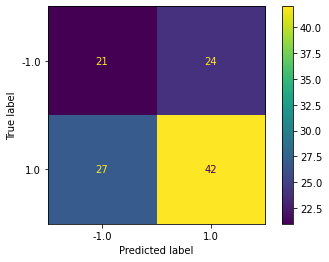

In [47]:
from sklearn.metrics import plot_confusion_matrix
_ = plot_confusion_matrix(model, X_test,  y_test)

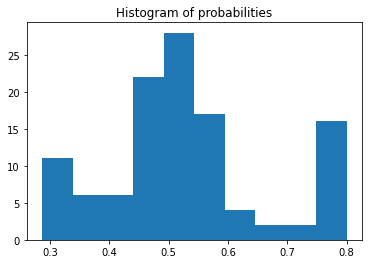

In [48]:
_ = plt.hist(probability)
_ = plt.title('Histogram of probabilities')

### Calculate z stat

In [49]:
def betSizeProb(prob, num_classes):
    signal = (prob - 1 / num_classes) / (prob * (1 - prob)) ** 0.5
    return 2 * norm.cdf(signal) - 1

In [50]:
bets_prob = betSizeProb(probability, 2)

In [51]:
bet_size = pd.DataFrame(bets_prob, columns=['prob'], index = y_test.index)
bets = pd.concat([bets, bet_size], axis=1, join='inner')
bets.head(8)

,gaussian,budgeting,prob
2019-04-01,0.356594,0.166667,0.062555
2019-04-12,0.356594,0.166667,-0.076658
2019-05-07,-0.246181,-0.250000,0.013370
2019-05-13,0.356594,0.166667,0.165841
2019-05-23,-0.246181,-0.250000,0.036568
2019-05-30,-0.246181,-0.250000,-0.022470
2019-06-04,0.356594,0.166667,0.035574
2019-06-07,0.356594,0.166667,0.080511


In [52]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=probability, y=bets_prob, mode="markers", name= 'Bet Size'))

fig.update_layout(
    xaxis_title="Predicted probability",
    yaxis_title="Bet size",
    width=600,
    height=500,
    font=dict(
        size=13,
        color="RebeccaPurple"
    )
)
fig.show()

## Bet size for multiple classes

- we follow a one-versus-rest method. Let X = {−1, … , 0, … , 1} be various labels associated with bet sizes, and x ∈ X the predicted label. 


$z=\frac{\tilde{p}-\frac{1}{\|X\|}}{\sqrt{\tilde{p}(1-\tilde{p})}} \sim Z$

In [53]:
def betSizeForRange(num_classes):
    prob = np.linspace(0, 1, 10000, endpoint=False)
    return pd.Series(betSizeProb(prob, num_classes), index=prob)

In [54]:
fig = go.Figure()

for num_classes in range(2, 11):
    bs = betSizeForRange(num_classes)
    fig.add_trace(go.Scatter(x=bs.index, y=bs, mode="lines", name= num_classes))


fig.update_layout(
    xaxis_title="Maximum predicted probability",
    yaxis_title="Bet size",
    legend_title="Number of classes",
    width=600,
    height=500,
    font=dict(
        size=13,
        color="RebeccaPurple"
    )
)

fig.show()

In [55]:
fig = bets.plot(title="Bet sizing", template="simple_white")
fig.show()

### Averaging Active Bets
- Every bet is associated with a holding period, spanning from the time it originated to the time the first barrier is touched, $t1$
- One possible approach is to override an old bet as a new bet arrives, but it may lead to **excessive turnover**. 


- A more sensible approach:  
    - Average all sizes across all bets still active at a given point in time

## Snippet 10.2

In [56]:
def avgActiveSignals(signals, numThreads):
    """
    compute the average signal among those active
    : param signals: a pd.df with
                Index: time, the start of the signal
                'signal': the betsize
                't1': the time at which the first barrier is touched 
    : param numThreads: for multithreading
    : return: pd.df, the average signal among those still active trade, or 0 if not active
    """
    # 1) time points where signals change (either one starts or one ends)
    # collect all the unique time points from signal['t1']
    tPnts = set(signals['t1'].dropna().values)
    # append all the unique time points (not exist in 't1') from signal.index 
    tPnts = tPnts.union(signals.index.values)
    # convert the set into a list
    tPnts = list(tPnts)
    # sort the list by chronological order
    tPnts.sort()
    # involke mpAvgActiveSignals and multiprocessing (or multithreading)
    out = mpPandasObj(mpAvgActiveSignals,
                        ('molecule',tPnts),
                        numThreads,
                        signals = signals)
    return out
#———————————————————————————————————————
def mpAvgActiveSignals(signals, molecule):
    """
    At time loc, average signal among those still active
    Signal is active if (there is a trade(s))
        a) issued before or at loc
        b) loc before signal's endtime, or endtime is still unknown (NaT)
    : param signals: a pd.df with
                Index: time, the start of the signal
                'signal': the betsize
                't1': the time at which the first barrier is touched 
    : param molecule: for multithreading
    : return: pd.df, the average signal among those still active trade, or 0 if not active
    """    
    # create an empty series, in case no loc
    out = pd.Series()
    # for each events (in the molecule)
    for loc in molecule:
        # determine whether the trade is active (by the above criteria)
        df0 = (signals.index.values <= loc) & ((loc<signals['t1'])| pd.isnull(signals['t1'])) 
        # return the index of those trades that make this trade active
        act = signals[df0].index
        # if is active, take the mean
        if len(act) > 0:
            out[loc] = signals.loc[act,'signal'].mean()
        # if not, assign 0, meaning no signals active at this time
        else:
            out[loc] = 0 # no signals active at this time
    return out

#### average active bets for gaussian bets

In [57]:
df1 = pd.concat([events['t1'], bets['gaussian']], axis=1, join='inner')
df1.columns = ['t1', 'signal']
df1.tail(10)

,t1,signal
2020-10-28,2020-11-02,0.356594
2020-11-02,2020-11-03,0.356594
2020-11-03,2020-11-09,0.356594
2020-11-09,2020-11-16,0.356594
2020-11-13,2020-11-24,0.979424
2020-11-16,2020-12-04,0.979424
2020-11-18,2020-11-24,0.999996
2020-11-24,2020-12-15,0.979424
2020-11-30,2020-12-04,0.999996
2020-12-03,2020-12-24,0.979424


In [58]:
active1 = avgActiveSignals(df1, 1)

In [59]:
active1 = pd.concat([df1, active1], axis=1, join='inner')
active1.columns = ['t1', 'signal', 'average signal']
active1.tail(10)

,t1,signal,average signal
2020-10-28,2020-11-02,0.356594,0.356594
2020-11-02,2020-11-03,0.356594,0.356594
2020-11-03,2020-11-09,0.356594,0.356594
2020-11-09,2020-11-16,0.356594,0.356594
2020-11-13,2020-11-24,0.979424,0.668009
2020-11-16,2020-12-04,0.979424,0.979424
2020-11-18,2020-11-24,0.999996,0.986281
2020-11-24,2020-12-15,0.979424,0.979424
2020-11-30,2020-12-04,0.999996,0.986281
2020-12-03,2020-12-24,0.979424,0.984567


In [60]:
active1[['signal', 'average signal']].plot()

#### average bet size for budgetting approach

In [61]:
df2 = pd.concat([events['t1'], bets['budgeting']], axis=1, join='inner')
df2.columns = ['t1', 'signal']

In [62]:
active2 = avgActiveSignals(df2, 1)

In [63]:
active2 = pd.concat([df2, active2], axis=1, join='inner')
active2.columns = ['t1', 'signal', 'average signal']
active2[['signal', 'average signal']].plot()

#### average active bets for predicted probabilities

In [64]:
df3 = pd.concat([events['t1'], bets['prob']], axis=1, join='inner')
df3.columns = ['t1', 'signal']

In [65]:
active3 = avgActiveSignals(df3, 1)

In [66]:
active3 = pd.concat([df3, active3], axis=1, join='inner')
active3.columns = ['t1', 'signal', 'average signal']
active3[['signal', 'average signal']].plot()

### SIZE DISCRETIZATION

- to avoid small trades will be triggered with every prediction:
- It is better to discretize the bet size as $m^{*} = round [\frac{m}{d}]\times d$ ,where d ∈ (0, 1] determines the degree of discretization.

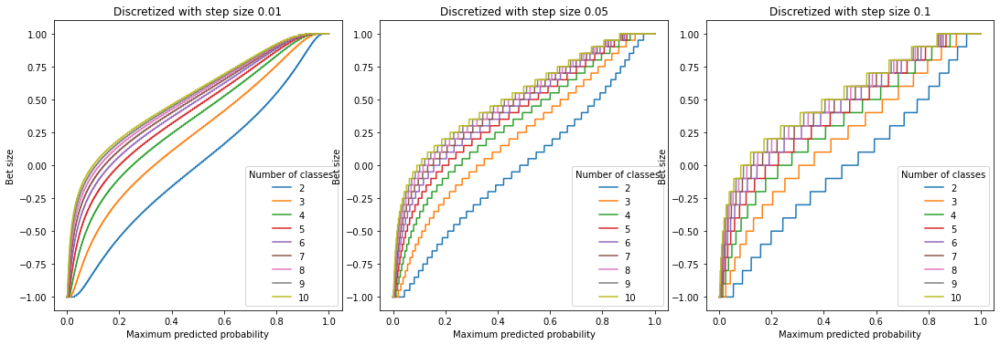

In [67]:
step_sizes = [0.01, 0.05, 0.1]
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.tight_layout()

for step_size, ax in zip(step_sizes, axes):
    for num_classes in range(2, 11):
        bs = betSizeForRange(num_classes)
        stepped = (bs / step_size).round() * step_size
        ax.plot(stepped, label=num_classes)

        ax.set_title("Discretized with step size %s" % step_size)
        ax.set_xlabel("Maximum predicted probability")
        ax.set_ylabel("Bet size")
        ax.legend(title="Number of classes")

## Snippet 10.3

In [68]:
def discreteSignal(signal0, stepSize):
    """
    discrete signal
    : param signals: a pd.df with
                Index: time, the start of the signal
                'signal': the betsize (averaged)
    : param stepSize: constant (0,1], degree of discretization
    : return: signals with discretised 'signal'
    """
    signal1 = (signal0/stepSize).round() * stepSize # discretize
    signal1[signal1>1] = 1 # cap, cannot > than 1
    signal1[signal1<-1] = -1 # floor cannot < than -1
    return signal1

### gaussian

In [69]:
active1['discrete avg signal'] = discreteSignal(active1['average signal'], 0.1)
active1[['signal', 'average signal', 'discrete avg signal']].plot()

### budgeting

In [70]:
active2['discrete avg signal'] = discreteSignal(active2['average signal'], 0.1)
active2[['signal', 'average signal', 'discrete avg signal']].plot()

### predicted prob

In [71]:
active3['discrete avg signal'] = discreteSignal(active3['average signal'], 0.1)
active3[['signal', 'average signal', 'discrete avg signal']].plot()

#### Plot differet bet size approaches

In [72]:
fig = make_subplots(rows=1, cols=2, subplot_titles=("Bet size","Adjusted bet size"))

fig.add_trace(go.Scatter(x=active1.index, y= bets['gaussian'], name= 'gaussian'), row=1, col=1)
fig.add_trace(go.Scatter(x=active2.index, y= bets['budgeting'] , name= 'budgeting'), row=1, col=1)
fig.add_trace(go.Scatter(x=active3.index, y= bets['prob'], name= 'predicted prob'), row=1, col=1)
fig.add_trace(go.Scatter(x=active1.index, y= active1['discrete avg signal'], name= 'gaussian-adj'), row=1, col=2)
fig.add_trace(go.Scatter(x=active2.index, y= active2['discrete avg signal'] , name= 'budgeting-adj'), row=1, col=2)
fig.add_trace(go.Scatter(x=active3.index, y= active3['discrete avg signal'], name= 'predicted prob-adj'), row=1, col=2)
# Update yaxis properties
fig.update_yaxes(title_text="m", range=[-1.1, 1.1], row=1, col=1)
fig.update_yaxes(title_text="m", range=[-1.1, 1.1], row=1, col=2)

fig.show()

## Snippet 10.1

In [73]:
def getSignal(events, stepSize, prob, pred, numClasses, numThreads, **kargs):
    """
    From probabilities to bet size
    : param events: pd.df with 
        Index: time (of the events, start of the signal) 
        t1: the time at which the first barrier is touched
        trgt: the target that was used to generate the horizontal barriers (but not used)
        side(optional): the side of the trade
    : param stepSize: constant (0,1], degree of discretization
    : param prob: constant, [0,1], the probability of the predicted outcome
    : param pred: constant, {-1...0...1}, the predicted outcomes
    : param numClasses: constant, the no. of possible outcomes/classes, default binary
    : param numThreads: constant, for multithread
    : param **kargs
    
    : return: constant, bet size
    """
    # get signals from predictions
    # if no prob, then return an empty pd.series
    if prob.shape[0] == 0:
        return pd.Series()
    
    # 1) Generate signals from multinomial classification (one-vs-rest, OvR)
    # z-value of OvR (test statistics)
    signal0 = (prob - 1. / numClasses)/ (prob * (1.-prob))**.5
    # bet size (signal) = side * size, (CDF(is) - CDF(isnot)) * side
    signal0 = pred*(2*norm.cdf(signal0)-1)
    
    # meta lebeling
    # if side is included in the input 'events'
    # flip the direction of the bet size if necessary
    if 'side' in events:
        signal0 *= events.loc[signal0.index, 'side'] 

    # convert signal0 from series to dataframe df0 and the col named 'signal'
    # join the t1 to the df0, the index is the same as the df0
    df0 = signal0.to_frame('signal').join(events[['t1']],how = 'left')
    
    # 2) Compute average singal among those concurrently open
    df0 = avgActiveSignals(df0, numThreads)
    
    # 3) Discretize the final values
    signal1 = discreteSignal(signal0 = df0, stepSize = stepSize)

    return signal1

### bet size methods returns

In [74]:
cum_rets = pd.DataFrame()

# gaussian approach
returns1 = (active1['discrete avg signal'] * out['ret']).dropna()
cum_rets['gaussian'] = ((returns1+1).cumprod())-1

# budgeting approach
returns2 = (active2['discrete avg signal'] * out['ret']).dropna()
cum_rets['budgeting'] = ((returns2+1).cumprod())-1

# predicted prob approach
returns3 = (active3['discrete avg signal'] * out['ret']).dropna()
cum_rets['prob'] = ((returns3+1).cumprod())-1

In [75]:
cum_rets.plot()

## Transaction cost
suppose we have 0.1% transaction cost

In [76]:
t_cost1 = abs(active1['discrete avg signal'].diff())*0.001; t_cost1

2019-04-01       NaN
2019-04-12    0.0000
2019-05-07    0.0006
2019-05-13    0.0006
2019-05-23    0.0006
               ...  
2020-11-16    0.0003
2020-11-18    0.0000
2020-11-24    0.0000
2020-11-30    0.0000
2020-12-03    0.0000
Name: discrete avg signal, Length: 114, dtype: float64

In [77]:
cum_rets_t = pd.DataFrame()

# gaussian approach
t_cost1 = abs(active1['discrete avg signal'].diff())*0.001
returns1 = ((active1['discrete avg signal'] * out['ret'])-t_cost1).dropna()
cum_rets_t['gaussian'] = ((returns1+1).cumprod())-1

# budgeting approach
t_cost2 = abs(active2['discrete avg signal'].diff())*0.001
returns2 = ((active2['discrete avg signal'] * out['ret'])-t_cost2).dropna()
cum_rets_t['budgeting'] = ((returns2+1).cumprod())-1

# predicted prob approach
t_cost3 = abs(active3['discrete avg signal'].diff())*0.001
returns3 = ((active3['discrete avg signal'] * out['ret'])-t_cost3).dropna()
cum_rets_t['prob'] = ((returns3+1).cumprod())-1

In [78]:
cum_rets_t.plot()

## Dynamic Position Size and Limit Price

In this section we will introduce an approach to adjust bet sizes as market price $P_{t}$ and forecast price $f_{i}$ fluctuate.

## An Example: Snippet 10.4

divergence:
- $x = f_{i} - p_{t}$

sigmoid function:
- $m[\omega,x]=\frac{x}{\sqrt{\omega+x^{2}}}$

#### 1) calibrate the sigmoid function
- $\omega = x^{2}(m^{*-2}-1)$

In [79]:
def getW(x,m):
    """
    The inverse function of the betSize with respect to the width of the sigmoid function w
    : params x: float, (f_i - p_t), the divergence between the forecast and the current market price
    : params m: float bet size
    : return: float, width of the sigmoid function w
    """
    return x**2*(m**-2-1)

In [80]:
wParams = {'divergence':10, 'm':.95}

In [81]:
w = getW(wParams['divergence'],wParams['m']); w

10.803324099723

#### 2) compute the target position

- $q_{t}$ : current position size
- $\hat{q}_{i,t}$ : target position size associated with forecast $f_{i}$
- $Q$ : the maximum absolute position size

$\hat{q}_{i,t} = int[m[\omega, f_{i}-p_{t}]\times Q]$

In [82]:
def betSize(w,x):
    """
    : params w: float, width of the sigmoid function 
    : params x: float, (f_i - p_t), the divergence between the forecast and the current market price
    
    : return: float, bet size
    """
    return x*(w+x**2)**-.5

In [83]:
def getTPos(w,f,mP,maxPos):
    """
    Get the target position size associated with the forecast f
    : params w: float, width of the sigmoid function
    : params f: float, forecast price
    : params mP: float, market price
    : params maxPos: maximum absolute position size
    
    : return: float, target position size
    """
    return int(betSize(w,f-mP)*maxPos)

In [84]:
maxPos, mP, f = 100, 100, 115

In [85]:
tPos = getTPos(w,f,mP,maxPos) # get tPos
tPos

97

#### 3) find the limit price
The target position size $\hat{q}_{i,t}$ can be dynamically adjusted as $p_{t}$ changes. In particular, as $p_{t}$ → $f_{i}$ we get $\hat{q}_{i,t}$ → 0, because the algorithm wants to realize the gains.

inverse price:  inverse function of $m[\omega, f_{i}-p_{t}]$ with respect to $p_{t}$
- $L[f_{i}, \omega, m]=f_{i}-m\times \sqrt{\frac{\omega}{1-m^{2}}}$

In [86]:
def invPrice(f,w,m):
    """
    The inverse function of the betSize with respect to the market price P
    : params f: float, forecast price
    : params w: float, width of the sigmoid function
    : params m: float, the bet size
    : return: float, the inverse price:
    """
    return f-m*(w/(1-m**2))**.5

Breakeven limit price ̄p for the order size $\hat{q}_{i,t}-q_{t}$ , to avoid realizing losses.

$\bar{p}=\frac{1}{\left|\hat{q}_{i, t}-q_{t}\right|} \sum_{j=\left|q_{t}+\operatorname{sgn}\left[\hat{q}_{i, t}-q_{t}\right]\right|} L\left[f_{i}, \omega, \frac{j}{Q}\right]$

In [87]:
def limitPrice(tPos,pos,f,w,maxPos):
    """
    Get the breakeven limit price to realise the gain or avoid loss
    : params tPos: float, target position size
    : params pos: float, current position size
    : params f: float, forecast price
    : params w: width of the sigmoid function
    : params maxPos: maximum absolute position size
    
    : return: float, limit price"""
    sgn = (1 if tPos >= pos else -1)
    lP = 0
    for j in range(abs(pos+sgn), abs(tPos+1)):
        lP += invPrice(f,w,j/float(maxPos))
    lP /= tPos - pos
    return lP

In [88]:
pos = 0

In [89]:
lP = limitPrice(tPos, pos, f, w, maxPos) # limit price for order

In [90]:
print(tPos)
print(lP)

97
112.36573855883363


As an alternative to the sigmoid function, we could have used a power function $\tilde{m}[\omega,x]=sgn[x]\|x|^{\omega}$, where 𝜔 ≥ 0, x ∈ [−1, 1], which results in ̃m [𝜔, x] ∈ [−1, 1]. This alternative presents the advantages that:
- ̃m [𝜔, −1] = −1, ̃m [𝜔, 1] = 1
- Curvature can be directly manipulated through 𝜔.
- For 𝜔 > 1, the function goes from concave to convex, rather than the other way around, hence the function is almost flat around the inflexion point.

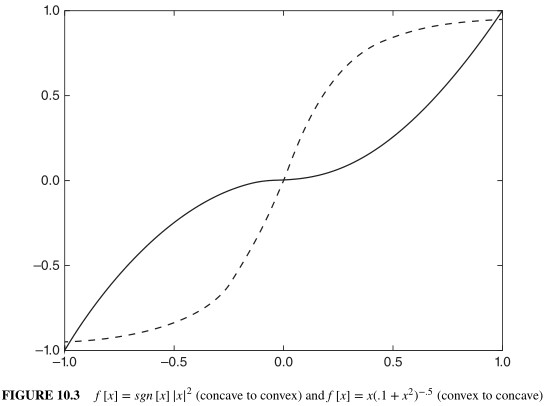

### apply to our dataset:

In [91]:
market_price = close[tEvents]; market_price

2010-01-22     52.4501
2010-02-04     51.2800
2010-02-18     53.1800
2010-03-05     54.9201
2010-03-23     56.9600
                ...   
2020-12-03    126.7500
2020-12-14    125.0500
2020-12-17    127.1000
2020-12-22    124.8700
2020-12-30    127.0000
Name: close, Length: 385, dtype: float64

In [92]:
svc_results

,prediction,probability,True label
2019-04-01,1.0,0.539120,1.0
2019-04-12,-1.0,0.452109,1.0
2019-05-07,1.0,0.508378,-1.0
2019-05-13,1.0,0.602463,1.0
2019-05-23,1.0,0.522900,-1.0
...,...,...,...
2020-11-16,-1.0,0.303358,1.0
2020-11-18,-1.0,0.290908,1.0
2020-11-24,-1.0,0.304981,1.0
2020-11-30,-1.0,0.306941,1.0


In [93]:
predicted_returns = (svc_results['prediction'] * events['trgt']).dropna(); predicted_returns

2019-04-01    0.009514
2019-04-12   -0.008136
2019-05-07    0.008324
2019-05-13    0.010299
2019-05-23    0.010327
                ...   
2020-11-16   -0.021583
2020-11-18   -0.021178
2020-11-24   -0.020596
2020-11-30   -0.019904
2020-12-03   -0.018368
Length: 114, dtype: float64

In [94]:
predicted_price = (market_price * (1+predicted_returns)).dropna(); predicted_price

2019-04-01    115.306646
2019-04-12    115.274478
2019-05-07    115.947144
2019-05-13    113.123147
2019-05-23    112.914130
                 ...    
2020-11-16    122.331423
2020-11-18    120.248320
2020-11-24    124.070840
2020-11-30    122.129744
2020-12-03    124.421845
Length: 114, dtype: float64

In [95]:
price = pd.concat([market_price, predicted_price], axis = 1, join='inner')
price.columns = ['market price', 'predicted price (t1)']
price

,market price,predicted price (t1)
2019-04-01,114.22,115.306646
2019-04-12,116.22,115.274478
2019-05-07,114.99,115.947144
2019-05-13,111.97,113.123147
2019-05-23,111.76,112.914130
...,...,...
2020-11-16,125.03,122.331423
2020-11-18,122.85,120.248320
2020-11-24,126.68,124.070840
2020-11-30,124.61,122.129744


divergence between the current market price and the forecast:

In [96]:
price['divergence'] = price['predicted price (t1)'] - price['market price']
print('Maximum divergence:', abs(price['divergence']).max())

Maximum divergence: 5.776980642810187


In [97]:
# Calibrate the sigmoid function with 0.95 of bet size for maximum divergence
w = getW(abs(price['divergence']).max(),m=0.95); w

3.605447946118398

In [98]:
# Calculate bet size for the dataset
price['Dynamic bet size'] = betSize(w, price['divergence'])
price

,market price,predicted price (t1),divergence,Dynamic bet size
2019-04-01,114.22,115.306646,1.086646,0.496696
2019-04-12,116.22,115.274478,-0.945522,-0.445750
2019-05-07,114.99,115.947144,0.957144,0.450125
2019-05-13,111.97,113.123147,1.153147,0.519078
2019-05-23,111.76,112.914130,1.154130,0.519401
...,...,...,...,...
2020-11-16,125.03,122.331423,-2.698577,-0.817835
2020-11-18,122.85,120.248320,-2.601680,-0.807750
2020-11-24,126.68,124.070840,-2.609160,-0.808555
2020-11-30,124.61,122.129744,-2.480256,-0.794028


In [99]:
price['Dynamic bet size'].plot()

# Thank you

---

# Advances in Financial Machine Learning
***Marcos Lopez de Prado***

### Chapter 11: *The Dangers of Backtesting*

##### Present by: Hirad Dolatzadeh

### Definition:  

a backtest is a historical simulation of how a strategy would have performed should it have been run over a past period of time.

### Motivation:

Backtesting is:  
- Most essential
- yet least understood


A full book could be written listing all the different errors people make while backtesting.

#### at a physics laboratory
- we can repeat an experiment
- controlling for environmental variables
- deduce a precise cause-effect relationship

#### in fiinance
- a backtest is not an experiment
- it does not prove anything
- the past would not repeat itself

#### Backtesting misuse
1. A researcher backtest thousands of trading rules (e.g., the factor zoo)
2. The best performing rule is proposed as a hypothesis (e.g., buy low P/E stocks)
3. The researcher publishes his hypothesis and presents as evidence the same backtest that he used to find the hypothesis

## Seven Sins of Quantitative Investing
1. **Survivorship bias:** Using as investment universe the current one, hence ignoring that some companies went bankrupt and securities were delisted along the way.
2. **Look-ahead bias:** Using information that was not public at the moment the simulated decision would have been made. Be certain about the timestamp for each data point. Take into account release dates, distribution delays, and backfill corrections.
3. **Storytelling:** Making up a story ex-post to justify some random pattern.
4. **Data mining and data snooping:** Training the model on the testing set.

## Seven Sins of Quantitative Investing
5. **Signal decay, turnover & transaction costs:** Simulating transaction costs is hard because the only way to be certain about that cost would have been to interact with the trading book (i.e., to do the actual trade).
6. **Outliers:** Basing a strategy on a few extreme outcomes that may never happen again as observed in the past.
7. **Shorting:** Taking a short position on cash products requires finding a lender. The cost of lending and the amount available is generally unknown, and depends on relations, inventory, relative demand, etc.

**Other common errors:**
- Computing performance using a non-standard method (Chapter 14)
- Ignoring hidden risks
- Focusing only on returns while ignoring other metrics
- Confusing correlation with causation
- Selecting an unrepresentative time period
- Failing to expect the unexpected
- Ignoring the existence of stop-out limits or margin calls
- Ignoring funding costs
- Forgetting practical aspects

### EVEN IF YOUR BACKTEST IS FLAWLESS, IT IS PROBABLY WRONG  

- Only an expert (who have run tens of thousands of backtests over the years) can produce a flawless backtest
- we need to account for the possibility that this is a false discovery
- a statistical fluke that inevitably comes up after you run multiple tests on the same dataset

### Multiple testing problem

> Recognize that any frequentist statistical test has a random chance of indicating significance when it is not really present. Running multiple tests on the same data set at the same stage of an analysis increases the chance of obtaining at least one invalid result. Selecting the one "significant" result from a multiplicity of parallel tests poses a grave risk of an incorrect conclusion. Failure to disclose the full extent of tests and their results in such a case would be highly misleading.
>>Professionalism Guideline 8, Ethical Guidelines for Statistical Practice, American Statistical Association, 1997

### BACKTESTING IS NOT A RESEARCH TOOL

Feature importance is a true research tool, because it helps us understand the nature of the patterns uncovered by the ML algorithm, regardless of their monetization. Critically, feature importance is derived ex-ante, before the historical performance is simulated.

Backtest is not a research tool. It provides us with very little insight into the reason why a particular strategy would have made money. Just as a lottery winner may feel he has done something to deserve his luck, there is always some ex-post story.

### BACKTESTING IS NOT A RESEARCH TOOL

The purpose of a backtest is to discard bad models, not to improve them

Never backtest until your model has been fully specified. If the backtest fails, start all over. If you do that, the chances of finding a false discovery will drop substantially, but still they will not be zero.

### Backtest overfitting:
Backtest overfitting takes place when a strategy is developed to perform well on a backtest, by monetizing random historical patterns. Because those random patterns are unlikely to
occur again in the future, the strategy so developed will fail.

### Ways to reduce the impacts of backtest overfitting:

1. Develop models for entire asset classes or investment universes, rather than for specific securities
    - if you find mistake X on security Y, , no matter how apparently profitable, it is likely a false discovery.  


2. Apply bagging as a means to both prevent overfitting and reduce the variance of the forecasting error.
    - If bagging deteriorates the performance of a strategy, it was likely overfit to a small number of observations or outliers.


3. Do not backtest until all your research is complete


### Ways to reduce the impacts of backtest overfitting:

4. Record every backtest conducted on a dataset so that the probability of backtest overfitting may be estimated on the final selected result


5. Simulate scenarios rather than history
    - History is just the random path that was realized
    - It could have been entirely different
    - Your strategy should be profitable under a wide range of scenarios
    

6. If the backtest fails to identify a profitable strategy, start from scratch

> **SNIPPET 11.1 MARCOS’ SECOND LAW OF BACKTESTING**
> 
>    “Backtesting while researching is like drinking and driving. Do not research under the influence of a backtest.” 
>
> ---Marcos Lopez de Prado  
> *Advances in Financial Machine Learning (2018)*

# STRATEGY SELECTION

presence of serial conditionality in labels defeats standard k-fold cross-validation, because the random sampling will spatter redundant observations into both the training and testing sets.

We must find a  (true out-of-sample) validation proceduree that evaluates our model on the observations least likely to be correlated/redundant to those used to train the model.

Scikit-learn has implemented a walk-forward timefolds method.
Disadvantage:
-  It can be easily overfit

We will introduce a CV method for strategy selection, based on
the estimation of the probability of backtest overfitting (PBO)

### combinatorially symmetric cross-validation (CSCV)

Estimate the PBO through the combinatorially symmetric
cross-validation (CSCV) method

### Matrix M

M = {$r_{t,n}$ : n=1,...,N, t=1,...,T }

Each column n = 1, … , N represents a vector of PnL (mark-to-market profits and losses) over t = 1, … , T observations associated with a particular model.

In [100]:
# feature scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.transform(X_test)
X = scaler.fit_transform(X)

In [101]:
# define a function to compute svc for multiple hyperparameters
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV

def svc_fit(kernel='rbf', C=1.0, degree=3.0, gamma='scale'):
    model_svc = SVC(kernel = kernel, C = C, degree = degree, gamma = gamma, class_weight='balanced', random_state=0)
    
    model = CalibratedClassifierCV(model_svc)
    model.fit(X, y)

    probability = pd.Series(model.predict_proba(X)[:,1], index=out.index)
    PnL = betSizeProb(probability, 2) * out['ret'] # profit and loss
    return PnL

In [102]:
pnl = svc_fit(kernel='rbf'); pnl

2010-02-04    0.001859
2010-02-18    0.005377
2010-03-05    0.003173
2010-03-23    0.001848
2010-04-14   -0.003320
                ...   
2020-11-16    0.003904
2020-11-18    0.005068
2020-11-24    0.000111
2020-11-30    0.004344
2020-12-03   -0.000742
Name: ret, Length: 380, dtype: float64

In [103]:
cum_ret = ((pnl+1).cumprod())-1
cum_ret.plot()

In [104]:
Kernels = ['linear', 'rbf', 'sigmoid', 'poly']
Cs = [0.01, 0.1, 0.5, 1, 10, 100]
gammas = [0.01, 0.1, 0.5, 1, 10, 100]
degrees = range(3, 10)

> **degree:** Degree of the polynomial kernel function (‘poly’). Ignored by all other kernels.  
> **gamma:** Kernel coefficient for ‘rbf’, ‘poly’ and ‘sigmoid’.

In [105]:
M = pd.DataFrame()

strategy_num = 1
for Kernel in Kernels:
    if Kernel == 'linear':
        for C in Cs:
            pnl = svc_fit(Kernel, C)
            name = 'N_'+str(strategy_num)  # Column name
            M[name] = pnl
            print('name: {}, Kernel: {}, C: {}'.format(name, Kernel, C))
            strategy_num += 1
            
    if Kernel == 'rbf' or Kernel == 'sigmoid':
        for C in Cs:
            for gamma in gammas:
                pnl = svc_fit(Kernel, C, gamma)
                name = 'N_'+str(strategy_num)  # Column name
                M[name] = pnl
                print('name: {}, Kernel: {}, C: {}, gamma: {}'.format(name, Kernel, C, gamma))
                strategy_num += 1
                
    if Kernel == 'poly':
        for C in [0.01, 0.1, 0.5, 1]:
            for gamma in [0.01, 0.1, 0.5, 1]:
                for degree in degrees:
                    pnl = svc_fit(Kernel, C, degree, gamma)
                    name = 'N_'+str(strategy_num)  # Column name
                    M[name] = pnl
                    print('name: {}, Kernel: {}, C: {}, gamma: {}, degree: {}'.format(name, Kernel, C, gamma, degree))
                    strategy_num += 1
        

name: N_1, Kernel: linear, C: 0.01
name: N_2, Kernel: linear, C: 0.1
name: N_3, Kernel: linear, C: 0.5
name: N_4, Kernel: linear, C: 1
name: N_5, Kernel: linear, C: 10
name: N_6, Kernel: linear, C: 100
name: N_7, Kernel: rbf, C: 0.01, gamma: 0.01
name: N_8, Kernel: rbf, C: 0.01, gamma: 0.1
name: N_9, Kernel: rbf, C: 0.01, gamma: 0.5
name: N_10, Kernel: rbf, C: 0.01, gamma: 1
name: N_11, Kernel: rbf, C: 0.01, gamma: 10
name: N_12, Kernel: rbf, C: 0.01, gamma: 100
name: N_13, Kernel: rbf, C: 0.1, gamma: 0.01
name: N_14, Kernel: rbf, C: 0.1, gamma: 0.1
name: N_15, Kernel: rbf, C: 0.1, gamma: 0.5
name: N_16, Kernel: rbf, C: 0.1, gamma: 1
name: N_17, Kernel: rbf, C: 0.1, gamma: 10
name: N_18, Kernel: rbf, C: 0.1, gamma: 100
name: N_19, Kernel: rbf, C: 0.5, gamma: 0.01
name: N_20, Kernel: rbf, C: 0.5, gamma: 0.1
name: N_21, Kernel: rbf, C: 0.5, gamma: 0.5
name: N_22, Kernel: rbf, C: 0.5, gamma: 1
name: N_23, Kernel: rbf, C: 0.5, gamma: 10
name: N_24, Kernel: rbf, C: 0.5, gamma: 100
name: N_2

name: N_165, Kernel: poly, C: 1, gamma: 0.01, degree: 5
name: N_166, Kernel: poly, C: 1, gamma: 0.01, degree: 6
name: N_167, Kernel: poly, C: 1, gamma: 0.01, degree: 7
name: N_168, Kernel: poly, C: 1, gamma: 0.01, degree: 8
name: N_169, Kernel: poly, C: 1, gamma: 0.01, degree: 9
name: N_170, Kernel: poly, C: 1, gamma: 0.1, degree: 3
name: N_171, Kernel: poly, C: 1, gamma: 0.1, degree: 4
name: N_172, Kernel: poly, C: 1, gamma: 0.1, degree: 5
name: N_173, Kernel: poly, C: 1, gamma: 0.1, degree: 6
name: N_174, Kernel: poly, C: 1, gamma: 0.1, degree: 7
name: N_175, Kernel: poly, C: 1, gamma: 0.1, degree: 8
name: N_176, Kernel: poly, C: 1, gamma: 0.1, degree: 9
name: N_177, Kernel: poly, C: 1, gamma: 0.5, degree: 3
name: N_178, Kernel: poly, C: 1, gamma: 0.5, degree: 4
name: N_179, Kernel: poly, C: 1, gamma: 0.5, degree: 5
name: N_180, Kernel: poly, C: 1, gamma: 0.5, degree: 6
name: N_181, Kernel: poly, C: 1, gamma: 0.5, degree: 7
name: N_182, Kernel: poly, C: 1, gamma: 0.5, degree: 8
name:

In [106]:
M

,N_1,N_2,N_3,N_4,N_5,N_6,N_7,N_8,N_9,N_10,...,N_181,N_182,N_183,N_184,N_185,N_186,N_187,N_188,N_189,N_190
2010-02-04,0.005711,0.010678,0.009143,0.009218,0.009478,0.008361,0.003892,0.003892,0.003892,0.003892,...,0.004602,0.004173,0.004583,0.003928,0.004143,0.004562,0.004170,0.003298,0.004030,0.003285
2010-02-18,0.005078,0.011174,0.009612,0.009458,0.010089,0.009337,0.003233,0.003233,0.003233,0.003233,...,0.003261,0.008438,0.000549,0.005351,0.004454,0.004826,0.004461,0.003995,0.005157,0.004021
2010-03-05,0.003277,0.007064,0.005863,0.005645,0.006138,0.005853,0.002192,0.002192,0.002192,0.002192,...,0.002714,0.005202,0.002796,0.005515,0.003024,0.003238,0.002923,0.002914,0.002948,0.001386
2010-03-23,0.001697,0.003052,0.001945,0.001699,0.001845,0.001880,0.001106,0.001106,0.001106,0.001106,...,0.001842,0.002968,0.001894,0.001763,0.001325,0.001678,0.001618,0.001640,0.001570,0.000846
2010-04-14,-0.002795,-0.005644,-0.004662,-0.004471,-0.004652,-0.004402,-0.001728,-0.001728,-0.001728,-0.001728,...,-0.003302,-0.000856,-0.004834,-0.001867,-0.003297,-0.002593,-0.002921,-0.004038,-0.002432,-0.003629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-16,0.001359,0.001747,0.004194,0.004303,0.005012,0.005094,0.003350,0.003350,0.003350,0.003350,...,0.002932,0.003662,0.003320,0.004185,0.003048,0.003542,0.003240,0.003286,0.003157,0.003172
2020-11-18,0.002087,0.002159,0.004939,0.004957,0.005313,0.005214,0.004705,0.004705,0.004705,0.004705,...,0.002933,0.006515,0.003403,0.008053,0.003387,0.003264,0.003867,0.002339,0.004079,0.002615
2020-11-24,0.000044,0.000002,0.000037,0.000031,0.000005,0.000007,0.000100,0.000100,0.000100,0.000100,...,0.000046,0.000190,0.000012,0.000121,0.000097,0.000108,0.000100,0.000077,0.000098,0.000073
2020-11-30,0.001929,0.001865,0.004649,0.004695,0.003942,0.003371,0.004520,0.004520,0.004520,0.004520,...,0.003824,0.003913,0.004125,0.004737,0.003734,0.004172,0.004081,0.003873,0.003792,0.003803


####  M is therefore a real-valued matrix of order (TxN)
conditions:

1. M is a true matrix, that is, with the same number of rows for each column, where observations are synchronous for every row across the N trials 


2. the performance evaluation metric used to choose the “optimal” strategy can be estimated on subsamples of each column.  
    - For example, if that metric is the Sharpe ratio, we assume that the IID Normal distribution assumption can be held on various slices of the reported performance.

- For overfitting to occur, the strategy configuration that delivers maximum performance in-sample (IS), must systematically underperform the remaining configuration out-of-sample (OOS)
- We define an abstract probability space in which the sample space consists of pairs of IS and OOS test results.

- Probability of Backtest Overfitting (PBO) defined as the probability that the best IS selected strategy performs below the average OOS. More precisely, for $N$ strategies 1,...N:
- In this sample space, PBO is the conditional probability the strategy underperforms the median OOS, while remaining optimal IS

$PBO = Pr$[$Rank_{OOS}$(X) $<$ $N/2$ | $Rank_{IS}$(X)=1]

We did use Sharpe ratio as a performance measure, but the approach can be applied to any alternative measure.

In [107]:
sharpe_ratio = lambda r: np.mean(r) / (np.std(r) + 0.0000001) * (365 ** 0.5)
objective = sharpe_ratio

The idea is to split the time window of length  𝑇  into  𝑆  blocks where  𝑆  is even and draw combinations of blocks.

We partition M across rows, into $S$ disjoint matrics of equal dimensions

$S$ = n_bins

Each submatrix $M_s$ is of order $(T/S \times N)$

$T/S$ = bin_size

In [108]:
n_bins = 12
bin_size = M.shape[0] // n_bins
bins = [M.iloc[i * bin_size: (i + 1) * bin_size] for i in range(n_bins)]

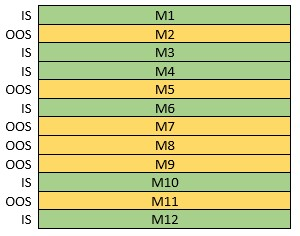

In [109]:
np.array(bins).shape

(12, 31, 190)

In [110]:
pd.DataFrame(bins[0])

,N_1,N_2,N_3,N_4,N_5,N_6,N_7,N_8,N_9,N_10,...,N_181,N_182,N_183,N_184,N_185,N_186,N_187,N_188,N_189,N_190
2010-02-04,0.005711,0.010678,0.009143,0.009218,0.009478,0.008361,0.003892,0.003892,0.003892,0.003892,...,0.004602,0.004173,0.004583,0.003928,0.004143,0.004562,0.004170,0.003298,0.004030,0.003285
2010-02-18,0.005078,0.011174,0.009612,0.009458,0.010089,0.009337,0.003233,0.003233,0.003233,0.003233,...,0.003261,0.008438,0.000549,0.005351,0.004454,0.004826,0.004461,0.003995,0.005157,0.004021
2010-03-05,0.003277,0.007064,0.005863,0.005645,0.006138,0.005853,0.002192,0.002192,0.002192,0.002192,...,0.002714,0.005202,0.002796,0.005515,0.003024,0.003238,0.002923,0.002914,0.002948,0.001386
2010-03-23,0.001697,0.003052,0.001945,0.001699,0.001845,0.001880,0.001106,0.001106,0.001106,0.001106,...,0.001842,0.002968,0.001894,0.001763,0.001325,0.001678,0.001618,0.001640,0.001570,0.000846
2010-04-14,-0.002795,-0.005644,-0.004662,-0.004471,-0.004652,-0.004402,-0.001728,-0.001728,-0.001728,-0.001728,...,-0.003302,-0.000856,-0.004834,-0.001867,-0.003297,-0.002593,-0.002921,-0.004038,-0.002432,-0.003629
2010-05-05,-0.006402,-0.010997,-0.008792,-0.008668,-0.008970,-0.008168,-0.004310,-0.004310,-0.004310,-0.004310,...,-0.005692,-0.004600,-0.005315,-0.004497,-0.005121,-0.005352,-0.004883,-0.005126,-0.004582,-0.005201
2010-05-07,0.006638,0.010332,0.004215,0.003327,0.004849,0.004946,0.005204,0.005204,0.005204,0.005204,...,0.006237,0.005778,0.006076,0.008141,0.005813,0.006138,0.005962,0.004050,0.005580,0.004580
2010-05-10,-0.005016,-0.008556,-0.004428,-0.003769,-0.004652,-0.004305,-0.003899,-0.003899,-0.003899,-0.003899,...,-0.004810,-0.004423,-0.005555,-0.004141,-0.004913,-0.004758,-0.004830,-0.004607,-0.004406,-0.004381
2010-05-18,-0.008576,-0.018272,-0.015983,-0.015767,-0.016589,-0.014269,-0.005638,-0.005638,-0.005638,-0.005638,...,-0.006081,-0.005562,-0.006670,-0.005593,-0.006398,-0.006156,-0.005768,-0.005309,-0.005493,-0.005771
2010-05-20,0.006314,0.013258,0.011170,0.010998,0.011770,0.009949,0.004256,0.004256,0.004256,0.004256,...,0.004422,0.003970,0.003865,0.010723,0.004508,-0.001582,0.004012,0.003601,0.004193,0.004223


We calculate all possible combinations of picking $S/2$ number of these submatrices out of the total number $S$

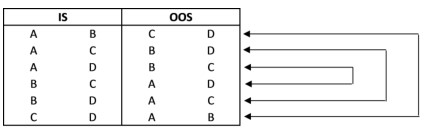

In [111]:
import itertools as itr
import math

In [112]:
bins_enumeration = [set(x) for x in itr.combinations(np.arange(n_bins), n_bins // 2)]   # list of all subsample combinations
Rs = [pd.Series(dtype=float) for i in range(len(bins_enumeration))]
R_bars = [pd.Series(dtype=float) for i in range(len(bins_enumeration))]

print(len(bins_enumeration))
bins_enumeration[0:5]

924


[{0, 1, 2, 3, 4, 5},
 {0, 1, 2, 3, 4, 6},
 {0, 1, 2, 3, 4, 7},
 {0, 1, 2, 3, 4, 8},
 {0, 1, 2, 3, 4, 9}]

In [113]:
for set_id, is_set in enumerate(bins_enumeration):
    oos_set = set(range(n_bins)) - is_set
    is_returns = pd.concat([bins[i] for i in is_set])
    oos_returns = pd.concat([bins[i] for i in oos_set])
    # calculate strategy performance in IS(R_df) and OOS(R_bar_df)
    R = objective(is_returns)
    R_bar = objective(oos_returns)
    Rs[set_id] = Rs[set_id].append(R)
    R_bars[set_id] = R_bars[set_id].append(R_bar)

In [114]:
R_df = pd.DataFrame(Rs)
R_bar_df = pd.DataFrame(R_bars)
R_df

,N_1,N_2,N_3,N_4,N_5,N_6,N_7,N_8,N_9,N_10,...,N_181,N_182,N_183,N_184,N_185,N_186,N_187,N_188,N_189,N_190
0,1.958842,2.305044,2.611104,2.677563,2.675429,2.618361,1.486449,1.486449,1.486449,1.486449,...,0.267856,4.296303,-0.453962,3.760090,0.079259,1.264317,0.950149,-0.988427,3.689788,-0.910476
1,2.465680,2.606537,2.782747,2.804102,2.817616,2.852768,2.093709,2.093709,2.093709,2.093709,...,0.780491,5.101488,0.085431,4.536234,0.641015,1.877372,1.539404,-0.419204,4.469056,-0.328661
2,1.971327,2.339586,2.446241,2.483807,2.499017,2.422503,1.110806,1.110806,1.110806,1.110806,...,-0.013663,4.207709,-0.664254,3.645433,-0.249571,0.971286,0.733549,-1.149874,3.470155,-1.088971
3,2.429309,2.639571,2.988890,3.030882,3.068415,3.105009,2.044019,2.044019,2.044019,2.044019,...,0.761980,5.211899,-0.032759,4.562793,0.636546,1.834199,1.744259,-0.388885,4.556352,-0.036487
4,1.947968,2.603940,2.446420,2.426669,2.485923,2.546902,0.682233,0.682233,0.682233,0.682233,...,-0.753370,3.987617,-1.569881,3.602689,-0.654024,0.710191,0.143358,-1.733869,3.517573,-1.259574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
919,2.242021,2.890020,2.119756,2.126686,2.432712,2.547737,1.162819,1.162819,1.162819,1.162819,...,-0.163606,4.107280,-1.783176,4.718015,-1.171242,0.894095,0.414237,-1.532954,2.647780,-0.514624
920,1.689953,2.843556,1.594913,1.574181,1.932071,2.094192,0.360053,0.360053,0.360053,0.360053,...,-1.239607,3.408508,-2.610987,4.271936,-1.910445,0.113673,-0.620245,-2.327195,2.228826,-1.287490
921,2.211315,3.343854,2.125097,2.083209,2.427148,2.651070,0.913568,0.913568,0.913568,0.913568,...,-0.694841,4.031703,-2.272491,4.747042,-1.391162,0.718052,0.049604,-1.917123,2.924522,-0.695969
922,1.657269,2.882087,1.810512,1.802329,2.166338,2.319123,0.394840,0.394840,0.394840,0.394840,...,-1.215662,3.551828,-2.647766,4.371403,-1.874234,0.126886,-0.412285,-2.293040,2.399799,-1.104337


#### calculate ranking of the strategies

In [115]:
R_rank_df = R_df.rank(axis=1, ascending=False, method='first')
R_bar_rank_df = R_bar_df.rank(axis=1, ascending=False, method='first')

In [116]:
R_rank_df

,N_1,N_2,N_3,N_4,N_5,N_6,N_7,N_8,N_9,N_10,...,N_181,N_182,N_183,N_184,N_185,N_186,N_187,N_188,N_189,N_190
0,85.0,60.0,51.0,48.0,49.0,50.0,126.0,127.0,128.0,129.0,...,173.0,17.0,179.0,33.0,177.0,147.0,149.0,186.0,35.0,183.0
1,97.0,72.0,63.0,62.0,61.0,58.0,126.0,127.0,128.0,129.0,...,174.0,17.0,179.0,32.0,177.0,146.0,155.0,186.0,35.0,183.0
2,76.0,53.0,51.0,49.0,48.0,52.0,135.0,136.0,137.0,138.0,...,173.0,17.0,179.0,32.0,177.0,147.0,155.0,186.0,36.0,183.0
3,112.0,81.0,57.0,56.0,54.0,53.0,133.0,134.0,135.0,136.0,...,173.0,16.0,180.0,31.0,177.0,147.0,154.0,185.0,33.0,182.0
4,73.0,48.0,52.0,53.0,51.0,50.0,142.0,143.0,144.0,145.0,...,174.0,25.0,183.0,34.0,173.0,141.0,166.0,185.0,37.0,180.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
919,64.0,55.0,68.0,67.0,61.0,60.0,134.0,135.0,136.0,137.0,...,169.0,37.0,187.0,21.0,181.0,150.0,157.0,184.0,59.0,176.0
920,63.0,46.0,64.0,65.0,60.0,59.0,133.0,134.0,135.0,136.0,...,169.0,39.0,186.0,22.0,181.0,149.0,157.0,184.0,58.0,172.0
921,63.0,53.0,64.0,65.0,61.0,59.0,133.0,134.0,135.0,136.0,...,171.0,38.0,186.0,22.0,181.0,151.0,157.0,184.0,58.0,173.0
922,65.0,46.0,62.0,63.0,60.0,59.0,133.0,134.0,135.0,136.0,...,174.0,38.0,186.0,22.0,181.0,151.0,156.0,184.0,56.0,170.0


find the IS performance of th strategies that has the best ranking in IS

In [117]:
r_star_series = (R_df * (R_rank_df == 1)).unstack().dropna()
r_star_series = r_star_series[r_star_series != 0].sort_index(level=-1)

In [118]:
pd.DataFrame(r_star_series)

0
N_120 0     8.865243
      1     9.757919
      2     8.769484
      3     9.527911
      4    10.768930
...              ...
N_146 919   5.845961
N_120 920   6.763773
N_146 921   7.319651
N_120 922   6.760608
N_146 923   7.239053

[924 rows x 1 columns]

#### find the OOS performance of the strategies that has the best ranking in IS

In [119]:
r_bar_star_series = (R_bar_df * (R_rank_df == 1)).unstack().dropna()
r_bar_star_series = r_bar_star_series[r_bar_star_series != 0].sort_index(level=-1)

In [120]:
pd.DataFrame(r_bar_star_series)

0
N_120 0     7.203501
      1     6.760608
      2     7.242959
      3     6.763773
      4     5.839059
...              ...
N_146 919  10.316741
N_120 920   9.527911
N_146 921   8.338471
N_120 922   9.757919
N_146 923   8.500150

[924 rows x 1 columns]

#### find the OOS ranking of strategies which has the best ranking in IS

In [121]:
r_bar_rank_series = (R_bar_rank_df * (R_rank_df == 1)).unstack().dropna()
r_bar_rank_series = r_bar_rank_series[r_bar_rank_series != 0].sort_index(level=-1)

In [122]:
pd.DataFrame(r_bar_rank_series)

0
N_120 0    2.0
      1    1.0
      2    2.0
      3    1.0
      4    2.0
...        ...
N_146 919  2.0
N_120 920  1.0
N_146 921  2.0
N_120 922  1.0
N_146 923  2.0

[924 rows x 1 columns]

- Now we determine the relative rank $\bar{R_{n^*}}$ within $\bar{R}$. We denote this relative rank with $\bar{\omega_{c}}$. And $\bar{\omega_{c}}$ $\in$ (0,1)

- This is the relative OOS performance of the best performing IS strategy

- If $\bar{R_{n^*}}$ systematically outperforms $\bar{R}$, just like $R_{n^*}$ outperforms $R$, the model does not overfit.

In [123]:
omega = (1 - ((r_bar_rank_series) / (len(R_df.columns) + 1)))

- If we define this logit:
    $\lambda_{c} = log[\frac{\bar{\omega_{c}}}{1-\bar{\omega_{c}}}]$
    
    Then $\lambda_{c}$ means that $\bar{\omega_{c}} = \frac{1}{2}$  which means that $\bar{R_{n^*}}$ coincides with the median of $\bar{R}$.
    
    So high logit values imply consistency betweein IS and OOS performance

In [124]:
logits = omega.map(lambda p: math.log(p / (1 - p)))

In [125]:
print('logits mean =',logits.mean(),'\nlogits STD =', logits.std())

logits mean = 4.583131907427643 
logits STD = 0.6905655040054256


In [126]:
fig = px.histogram(logits, nbins=100)
fig.update_layout(
    xaxis_title='Logits',
    yaxis_title='Frequency',
    width=600,
    height=500,
    font=dict(
        size=13,
        color="RebeccaPurple"
    ),
    title={
        'text': 'Probability Distribution',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}
)
fig.show()

In [127]:
# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([logits], ['logits'],
                         curve_type='normal')
# Add title
fig.update_layout(title_text='Distplot with Normal Distribution')
fig.show()

Finally, we can estimate PBO as:

$PBO = \int_{-\infty}^0 \! f(\lambda) \, \mathrm{d}\lambda$

In [128]:
PBO = (logits < 0).sum() / len(logits)

In [129]:
print('Probability of backtest overfitting:', PBO)

Probability of backtest overfitting: 0.0


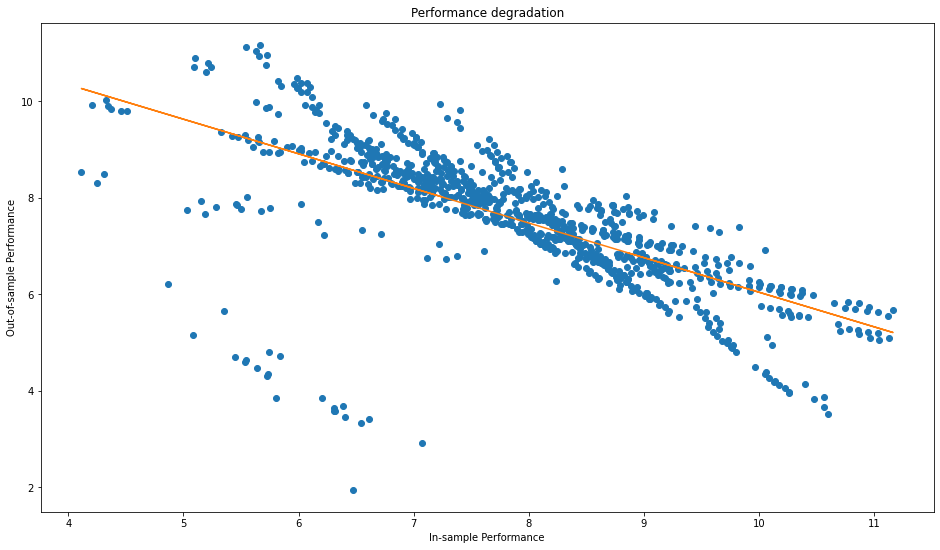

In [130]:
plt.figure(figsize=(16,9))

x = r_star_series
y = r_bar_star_series
plt.plot(x, y, 'o')
m, b = np.polyfit(x, y, 1)

plt.title('Performance degradation')
plt.xlabel('In-sample Performance')
plt.ylabel('Out-of-sample Performance')

plt.plot(x, m*x + b)

In [131]:
fig = go.Figure(data=go.Scatter(x=r_star_series,
                                y=r_bar_star_series,
                                mode='markers',
                                marker_color=r_bar_rank_series)) 

fig.update_layout(title='Performance degradation')
fig.update_xaxes(title_text='In-sample Performance')
fig.update_yaxes(title_text='Out-of-sample Performance')

fig.show()

In [132]:
sharpe_ratio = lambda r: np.mean(r) / (np.std(r) + 0.0000001) * (365 ** 0.5) 

In [133]:
def CSCV(M, n_bins=12, objective = sharpe_ratio):

    bins_enumeration = [set(x) for x in itr.combinations(np.arange(n_bins), n_bins // 2)]   # list of all subsample combinations
    Rs = [pd.Series(dtype=float) for i in range(len(bins_enumeration))]
    R_bars = [pd.Series(dtype=float) for i in range(len(bins_enumeration))]    
    
    bin_size = M.shape[0] // n_bins
    bins = [M.iloc[i * bin_size: (i + 1) * bin_size] for i in range(n_bins)]

    for set_id, is_set in enumerate(bins_enumeration):
        oos_set = set(range(n_bins)) - is_set
        is_returns = pd.concat([bins[i] for i in is_set])
        oos_returns = pd.concat([bins[i] for i in oos_set])
        R = objective(is_returns)
        R_bar = objective(oos_returns)
        Rs[set_id] = Rs[set_id].append(R)
        R_bars[set_id] = R_bars[set_id].append(R_bar)  
           
    # calculate strategy performance in IS(R_df) and OOS(R_bar_df)
    R_df = pd.DataFrame(Rs)
    R_bar_df = pd.DataFrame(R_bars)

    # calculate ranking of the strategies
    R_rank_df = R_df.rank(axis=1, ascending=False, method='first')
    R_bar_rank_df = R_bar_df.rank(axis=1, ascending=False, method='first')

    # find the IS performance of th trategies that has the best ranking in IS
    r_star_series = (R_df * (R_rank_df == 1)).unstack().dropna()
    r_star_series = r_star_series[r_star_series != 0].sort_index(level=-1)

    # find the OOS performance of the strategies that has the best ranking in IS
    r_bar_star_series = (R_bar_df * (R_rank_df == 1)).unstack().dropna()
    r_bar_star_series = r_bar_star_series[r_bar_star_series != 0].sort_index(level=-1)

    # find the ranking of strategies which has the best ranking in IS
    r_bar_rank_series = (R_bar_rank_df * (R_rank_df == 1)).unstack().dropna()
    r_bar_rank_series = r_bar_rank_series[r_bar_rank_series != 0].sort_index(level=-1)

    # probability of overfitting

    # estimate logits of OOS rankings
    logits = (1 - ((r_bar_rank_series) / (len(R_df.columns) + 1))).map(lambda p: math.log(p / (1 - p)))
    PBO = (logits < 0).sum() / len(logits)
    return logits, PBO, r_star_series, r_bar_star_series

In [134]:
nstrategy = 100
nreturns = 4001
returns = pd.DataFrame({'N' + str(i): np.random.normal(0, 0.02, size=nreturns) for i in range(nstrategy)})

In [135]:
returns

,N0,N1,N2,N3,N4,N5,N6,N7,N8,N9,...,N90,N91,N92,N93,N94,N95,N96,N97,N98,N99
0,-0.002967,-0.044986,-0.000962,-0.005810,0.009528,0.005379,-0.019050,-0.023999,-0.018584,0.017556,...,-0.002567,-0.009036,-0.047092,0.019512,0.029431,-0.024989,-0.010521,0.008172,-0.043113,-0.021309
1,0.000818,0.043251,0.001335,-0.005481,-0.034016,-0.021761,-0.007998,0.015438,-0.000792,-0.016068,...,-0.047485,0.012640,0.005735,0.016586,-0.000698,-0.018661,-0.006714,0.010647,0.003555,0.013205
2,-0.015081,-0.029384,0.016255,-0.031858,-0.015466,0.021144,0.002937,0.003539,-0.020302,0.009074,...,-0.025380,-0.011548,-0.013001,0.031425,0.020891,0.000258,0.002043,-0.015883,0.002644,0.011704
3,-0.021275,-0.005945,-0.011825,0.020565,-0.009955,0.007401,0.013405,-0.035015,-0.006793,0.003062,...,-0.014024,-0.017114,-0.035512,0.006199,0.001817,0.016463,0.004876,0.018970,-0.003904,-0.005702
4,0.018644,-0.000351,-0.012031,0.010328,-0.018872,-0.003632,-0.005780,-0.005343,-0.026305,-0.001610,...,0.013428,-0.025544,-0.004559,-0.020454,0.005583,0.018049,-0.009673,-0.006297,0.018174,-0.023908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3996,0.023995,0.009938,0.012653,0.002473,0.018132,0.001175,0.027252,-0.013612,0.007348,-0.003539,...,-0.000574,0.017803,-0.011861,-0.043717,-0.003489,0.012743,-0.009665,0.012721,0.002697,-0.033020
3997,-0.010552,-0.026065,0.015508,-0.040813,-0.000929,-0.001600,0.020871,0.009236,0.015143,-0.031935,...,-0.007014,0.017742,-0.022151,0.002188,0.017719,0.001847,-0.007536,0.010822,0.025150,0.002233
3998,-0.009007,-0.008980,0.039568,-0.036866,0.002858,0.007291,0.011760,-0.004301,-0.008556,-0.000754,...,-0.005177,0.005971,-0.003482,0.003284,-0.004354,-0.037501,-0.012590,0.009656,-0.010698,0.009888
3999,0.002482,-0.006294,-0.009236,-0.014814,-0.002270,0.004438,-0.015921,0.023067,-0.002300,0.031622,...,0.042186,-0.016863,0.008232,0.002640,0.017855,0.006423,0.032457,-0.026295,0.014463,-0.007943


In [136]:
logits, PBO, r_star_series, r_bar_star_series = CSCV(returns, 12)

In [137]:
# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([logits], ['logits'],
                         curve_type='normal')
# Add title
fig.update_layout(title_text='Distplot with Normal Distribution')
fig.show()

In [138]:
print('Probability of backtest overfitting:', PBO)

Probability of backtest overfitting: 0.3354978354978355


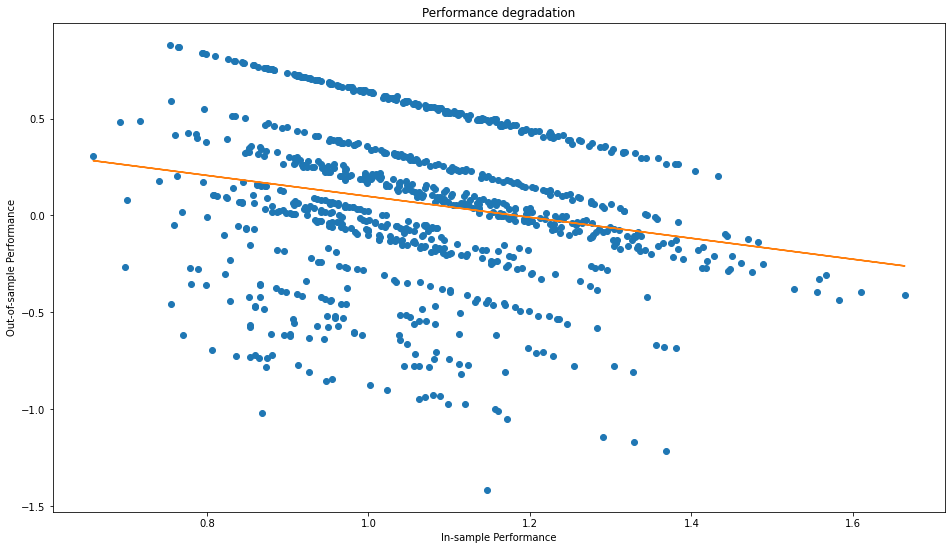

In [139]:
plt.figure(figsize=(16,9))

x = r_star_series
y = r_bar_star_series
plt.plot(x, y, 'o')
m, b = np.polyfit(x, y, 1)

plt.title('Performance degradation')
plt.xlabel('In-sample Performance')
plt.ylabel('Out-of-sample Performance')

plt.plot(x, m*x + b)

In [140]:
fig = go.Figure(data=go.Scatter(x=r_star_series,
                                y=r_bar_star_series,
                                mode='markers',
                                marker_color=r_bar_rank_series))

fig.update_layout(title='Performance degradation')
fig.update_xaxes(title_text='In-sample Performance')
fig.update_yaxes(title_text='Out-of-sample Performance')

fig.show()